==================================================================================================


Graded Challenge 7

Nama  : Gita Pramoedya Sastri

Batch : RMT-028



Problem Statement:

Pada program ini, kami bertujuan untuk mengembangkan sebuah sistem pengenalan jenis-jenis ubur-ubur (jellyfish) menggunakan compter vision. Ubur-ubur adalah hewan laut yang bervariasi secara morfologi dan sering kali sulit untuk dibedakan satu sama lain. Oleh karena itu, penggunaan teknologi pengenalan gambar dapat membantu dalam mengidentifikasi dan membedakan berbagai jenis ubur-ubur.

Objective :

Tujuan utama dari program ini adalah untuk membuat model komputer vision yang mampu mengidentifikasi dan mengklasifikasikan jenis-jenis ubur-ubur berdasarkan gambar yang berasal dari [Kaggle datasets](https://www.kaggle.com/datasets/anshtanwar/jellyfish-types/data). Program ini dapat digunakan dalam berbagai aplikasi, termasuk penelitian kelautan, konservasi lingkungan, dan pencegahan insiden terkait ubur-ubur di perairan.

==================================================================================================

# **1. Import Library**

In [ ]:
# Import libraries

import os
import cv2
import glob
import random
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import tensorflow as tf
# from tensorflow.keras.preprocessing import image
# from tensorflow.keras import layers
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import LeakyReLU, Dense, Dropout, Conv2D, MaxPooling2D, Flatten, Input

from sklearn.metrics import ConfusionMatrixDisplay, classification_report
import warnings
warnings.filterwarnings('ignore')

**Data Loading**

In [ ]:
#Connect to Kaggle dataset
!pip install -q kaggle

token = '{"username":"gitapramoedyas","key":"48b7bd0556dd503ebacd87771a630538"}'

with open("kaggle.json", "w") as f:
  f.write(token)

! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
%%time
# Download Dataset
# Source dataset : https://www.kaggle.com/datasets/anshtanwar/jellyfish-types

!kaggle datasets download -d anshtanwar/jellyfish-types

 67% 17.0M/25.5M [00:00<00:00, 40.1MB/s]
100% 25.5M/25.5M [00:00<00:00, 53.8MB/s]
CPU times: user 25.9 ms, sys: 2.6 ms, total: 28.5 ms
Wall time: 1.94 s


In [ ]:
# Unzip dataset

!unzip ./jellyfish-types.zip

Archive:  ./jellyfish-types.zip
  inflating: Moon_jellyfish/01.jpg   
  inflating: Moon_jellyfish/02.jpg   
  inflating: Moon_jellyfish/03.jpg   
  inflating: Moon_jellyfish/04.jpg   
  inflating: Moon_jellyfish/05.jpg   
  inflating: Moon_jellyfish/06.jpg   
  inflating: Moon_jellyfish/08.jpg   
  inflating: Moon_jellyfish/10.jpg   
  inflating: Moon_jellyfish/12.jpg   
  inflating: Moon_jellyfish/13.jpg   
  inflating: Moon_jellyfish/14.jpg   
  inflating: Moon_jellyfish/16.jpg   
  inflating: Moon_jellyfish/17.jpg   
  inflating: Moon_jellyfish/18.jpg   
  inflating: Moon_jellyfish/21.jpg   
  inflating: Moon_jellyfish/22.jpg   
  inflating: Moon_jellyfish/24.jpg   
  inflating: Moon_jellyfish/25.jpg   
  inflating: Moon_jellyfish/26.jpg   
  inflating: Moon_jellyfish/28.jpg   
  inflating: Moon_jellyfish/29.JPG   
  inflating: Moon_jellyfish/30.jpg   
  inflating: Moon_jellyfish/31.jpg   
  inflating: Moon_jellyfish/32.jpg   
  inflating: Moon_jellyfish/34.jpg   
  inflating: Moon_

In [ ]:
# Define path

main_path = '/content/Train_Test_Valid/'
train_path = os.path.join(main_path, 'Train')
val_path = os.path.join(main_path, 'valid')
test_path = os.path.join(main_path, 'test')

In [ ]:
# Check how many data in `train_path` `val_path` and `test_path`

def check_path(path):
  labels = os.listdir(path)
  for label in labels:
    num_data = len(os.listdir(os.path.join(path, label)))
    print(f'Total Data - {label} : {num_data}')

print('Train Path')
check_path(train_path)
print('')

print('Val Path')
check_path(val_path)
print('')

print('Test Path')
check_path(test_path)
print('')

Train Path
Total Data - barrel_jellyfish : 150
Total Data - lions_mane_jellyfish : 150
Total Data - blue_jellyfish : 150
Total Data - compass_jellyfish : 150
Total Data - Moon_jellyfish : 150
Total Data - mauve_stinger_jellyfish : 150

Val Path
Total Data - barrel_jellyfish : 5
Total Data - lions_mane_jellyfish : 7
Total Data - blue_jellyfish : 7
Total Data - compass_jellyfish : 7
Total Data - Moon_jellyfish : 6
Total Data - mauve_stinger_jellyfish : 7

Test Path
Total Data - barrel_jellyfish : 5
Total Data - lions_mane_jellyfish : 8
Total Data - blue_jellyfish : 7
Total Data - compass_jellyfish : 7
Total Data - Moon_jellyfish : 6
Total Data - mauve_stinger_jellyfish : 7



In [ ]:
# # Renaming filenames of each category

# moonjel_files = glob.glob('/content/Train_Test_Valid/Train/Moon_jellyfish/*')
# num = 1
# for mf in moonjel_files:
#   os.rename(mf, '/content/Train_Test_Valid/Train/Moon_jellyfish/moon_' + "{:03d}".format(num) + '.jpg')
#   num += 1

# barreljel_files = glob.glob('/content/Train_Test_Valid/Train/barrel_jellyfish/*')
# num = 1
# for bf in barreljel_files:
#   os.rename(bf, '/content/Train_Test_Valid/Train/barrel_jellyfish/barrel_' + "{:03d}".format(num) + '.jpg')
#   num += 1

# bluejel_files = glob.glob('/content/Train_Test_Valid/Train/blue_jellyfish/*')
# num = 1
# for blf in bluejel_files:
#   os.rename(blf, '/content/Train_Test_Valid/Train/blue_jellyfish/blue_' + "{:03d}".format(num) + '.jpg')
#   num += 1

# compjel_files = glob.glob('/content/Train_Test_Valid/Train/compass_jellyfish/*')
# num = 1
# for cf in compjel_files:
#   os.rename(cf, '/content/Train_Test_Valid/Train/compass_jellyfish/compass_' + "{:03d}".format(num) + '.jpg')
#   num += 1

# lmjel_files = glob.glob('/content/Train_Test_Valid/Train/lions_mane_jellyfish/*')
# num = 1
# for lf in lmjel_files:
#   os.rename(lf, '/content/Train_Test_Valid/Train/lions_mane_jellyfish/lions_mane_' + "{:03d}".format(num) + '.jpg')
#   num += 1

# mauvejel_files = glob.glob('/content/Train_Test_Valid/Train/mauve_stinger_jellyfish/*')
# num = 1
# for mvf in barreljel_files:
#   os.rename(mvf, '/content/Train_Test_Valid/Train/mauve_stinger_jellyfish/mauve_stinger_' + "{:03d}".format(num) + '.jpg')
#   num += 1

In [ ]:
# Listing images of each category

moonjel_files = glob.glob('/content/Train_Test_Valid/Train/Moon_jellyfish/*')
barreljel_files = glob.glob('/content/Train_Test_Valid/Train/barrel_jellyfish/*')
bluejel_files = glob.glob('/content/Train_Test_Valid/Train/blue_jellyfish/*')
compjel_files = glob.glob('/content/Train_Test_Valid/Train/compass_jellyfish/*')
lmjel_files = glob.glob('/content/Train_Test_Valid/Train/lions_mane_jellyfish/*')
mauvejel_files = glob.glob('/content/Train_Test_Valid/Train/mauve_stinger_jellyfish/*')

moonjel_files.sort()
barreljel_files.sort()
bluejel_files.sort()
compjel_files.sort()
lmjel_files.sort()
mauvejel_files.sort()

print('moonjel_files : ', moonjel_files)
print('')
print('barreljel_files : ', barreljel_files)
print('')
print('bluejel_files : ', bluejel_files)
print('')
print('compjel_files : ', compjel_files)
print('')
print('lmjel_files : ', lmjel_files)
print('')
print('mauvejel_files : ', mauvejel_files)
print('')

moonjel_files :  ['/content/Train_Test_Valid/Train/Moon_jellyfish/01.jpg', '/content/Train_Test_Valid/Train/Moon_jellyfish/02.jpg', '/content/Train_Test_Valid/Train/Moon_jellyfish/03.jpg', '/content/Train_Test_Valid/Train/Moon_jellyfish/04.jpg', '/content/Train_Test_Valid/Train/Moon_jellyfish/05.jpg', '/content/Train_Test_Valid/Train/Moon_jellyfish/06.jpg', '/content/Train_Test_Valid/Train/Moon_jellyfish/08.jpg', '/content/Train_Test_Valid/Train/Moon_jellyfish/10.jpg', '/content/Train_Test_Valid/Train/Moon_jellyfish/12.jpg', '/content/Train_Test_Valid/Train/Moon_jellyfish/13.jpg', '/content/Train_Test_Valid/Train/Moon_jellyfish/14.jpg', '/content/Train_Test_Valid/Train/Moon_jellyfish/16.jpg', '/content/Train_Test_Valid/Train/Moon_jellyfish/17.jpg', '/content/Train_Test_Valid/Train/Moon_jellyfish/18.jpg', '/content/Train_Test_Valid/Train/Moon_jellyfish/21.jpg', '/content/Train_Test_Valid/Train/Moon_jellyfish/22.jpg', '/content/Train_Test_Valid/Train/Moon_jellyfish/24.jpg', '/content/Tra

In [ ]:
# # Create a Pandas DataFrame that contains the path of all images

# all_files = moonjel_files + barreljel_files + bluejel_files + compjel_files + lmjel_files + mauvejel_files
# labels = ['moon_jellyfish' for i in range(len(moonjel_files))] + ['barrel_jellyfish' for i in range(len(barreljel_files))] + ['blue_jellyfish' for i in range(len(bluejel_files))] + ['compass_jellyfish' for i in range(len(compjel_files))] + ['lions_mane_jellyfish' for i in range(len(lmjel_files))] + ['compass_jellyfish' for i in range(len(compjel_files))] + ['mauve_stinger_jellyfish' for i in range(len(mauvejel_files))]
# img_df = pd.DataFrame({'images':all_files, 'label':labels})
# img_df = img_df.sample(len(img_df)).reset_index(drop=True)
# img_df

# **2. EDA Dataset**

In [ ]:
# # Visualize Image Resolutions

# fig = plt.figure(figsize=(8, 8))
# ax = fig.add_subplot(1, 2, 1)
# points = ax.histplot(img_df.Width, img_df.Height, color='blue', alpha=0.5, s=img_df["Aspect Ratio"]*100, picker=True)
# ax.set_title("Image Resolution")
# ax.set_xlabel("Width", size=14)
# ax.set_ylabel("Height", size=14)

In [ ]:
# Function to visualize the first 5 images from each class

def plot_images(path):
  labels = os.listdir(path)
  for label in labels:
    folder_path = os.path.join(path, label)
    fig = plt.figure(figsize=(20, 20))
    columns = 4
    rows = 1
    print('Class : ', label)
    images = os.listdir(folder_path)
    for index in range(1, columns*rows +1):
        fig.add_subplot(rows, columns, index)
        image = plt.imread(os.path.join(folder_path, images[index]))
        plt.imshow(image)
        plt.axis("off")
    plt.show()

Class :  barrel_jellyfish


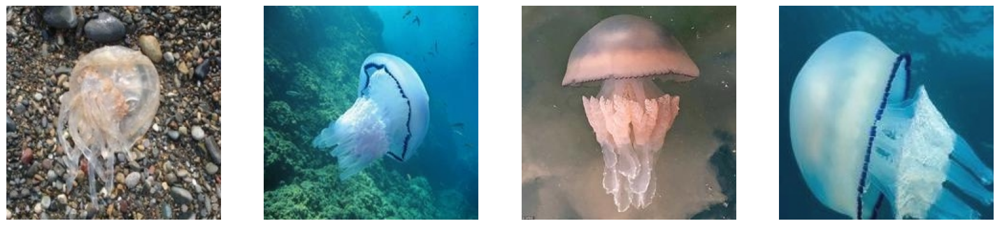

Class :  lions_mane_jellyfish


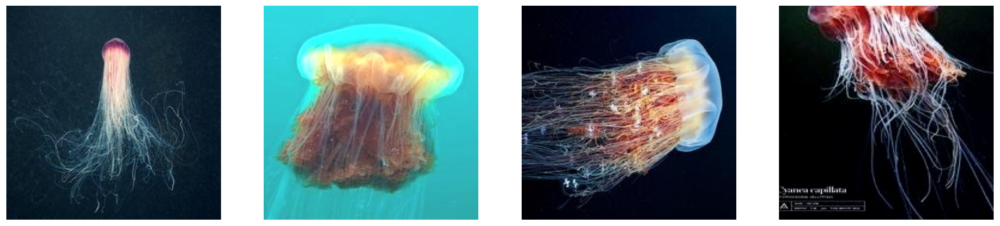

Class :  blue_jellyfish


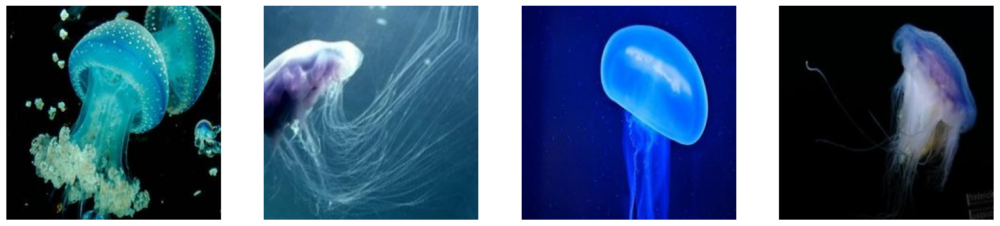

Class :  compass_jellyfish


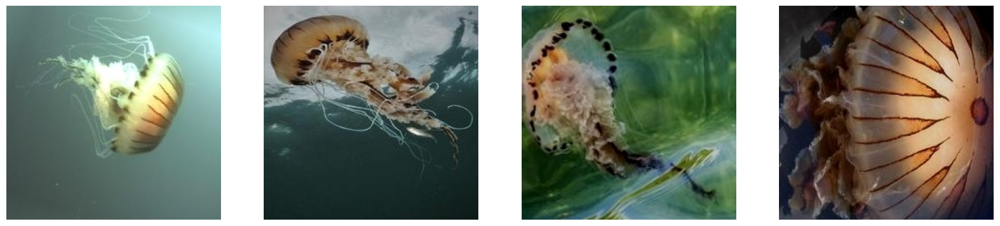

Class :  Moon_jellyfish


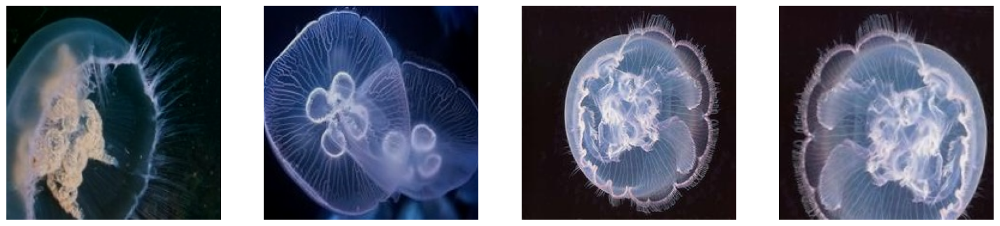

Class :  mauve_stinger_jellyfish


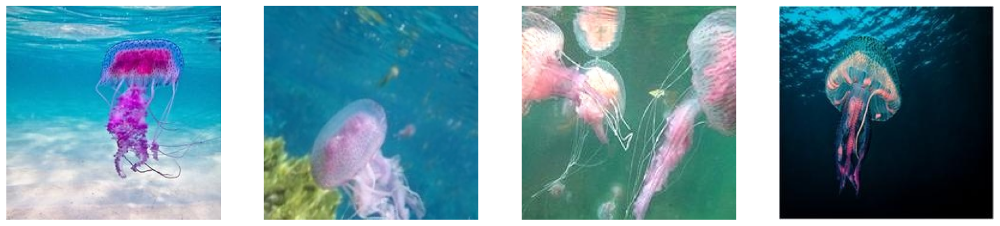

In [ ]:
# Visualization of train_path

plot_images(train_path)

Class :  barrel_jellyfish


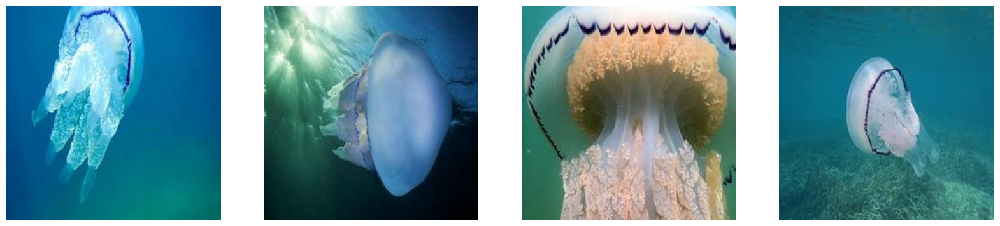

Class :  lions_mane_jellyfish


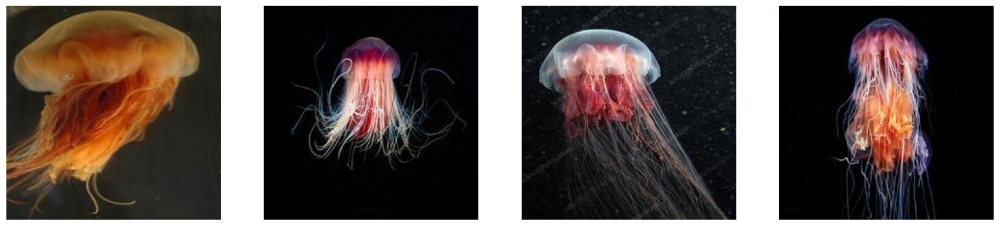

Class :  blue_jellyfish


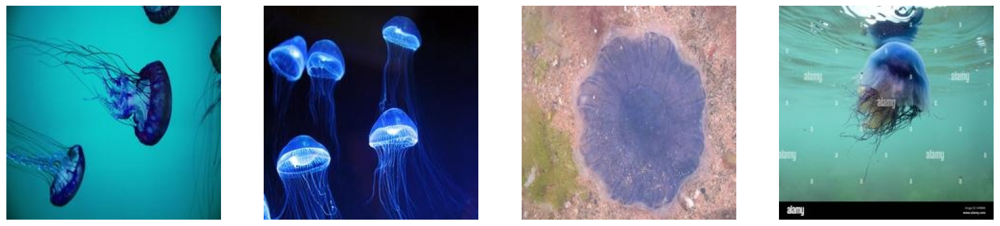

Class :  compass_jellyfish


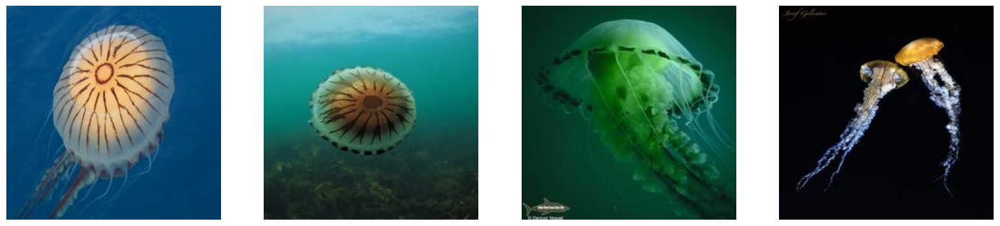

Class :  Moon_jellyfish


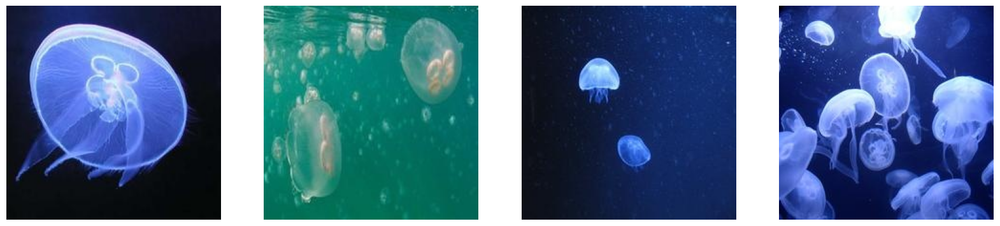

Class :  mauve_stinger_jellyfish


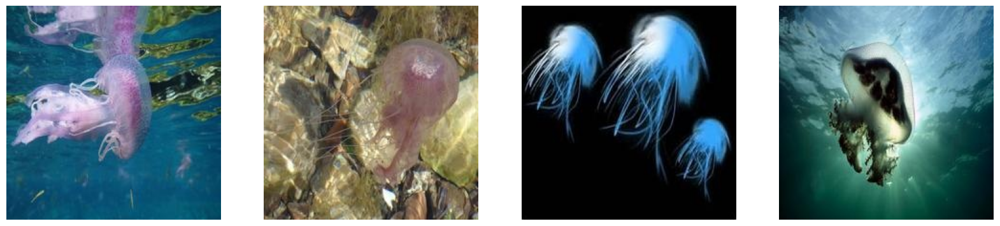

In [ ]:
# Visualization of val_path

plot_images(val_path)

Class :  barrel_jellyfish


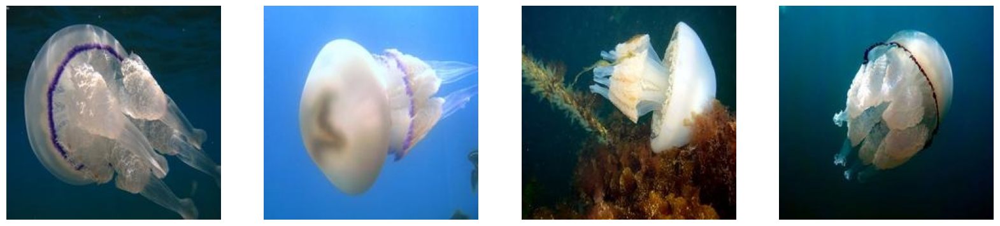

Class :  lions_mane_jellyfish


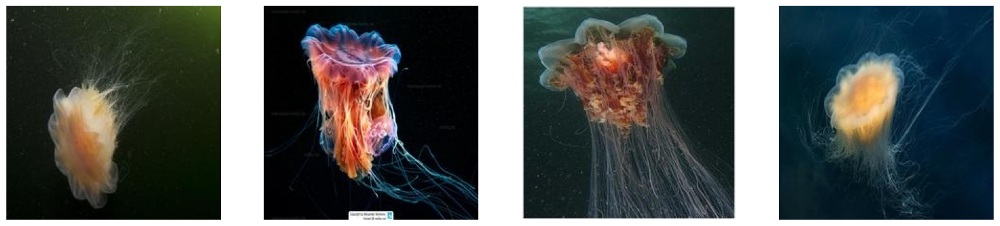

Class :  blue_jellyfish


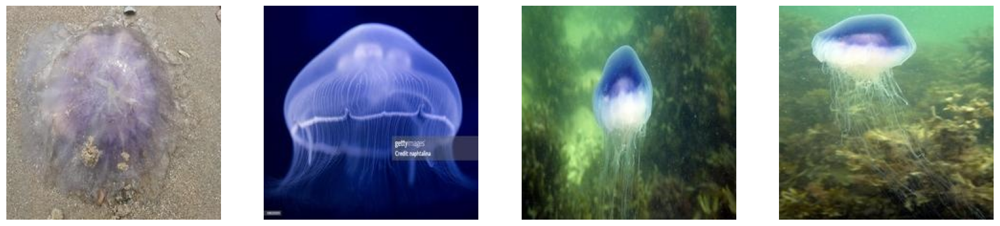

Class :  compass_jellyfish


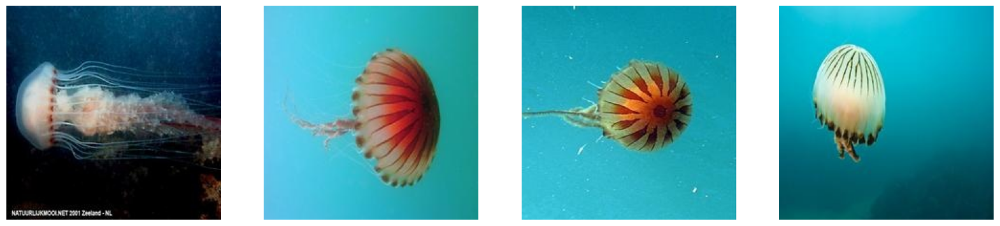

Class :  Moon_jellyfish


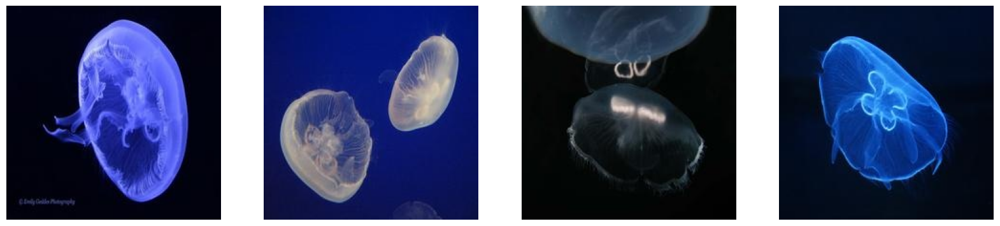

Class :  mauve_stinger_jellyfish


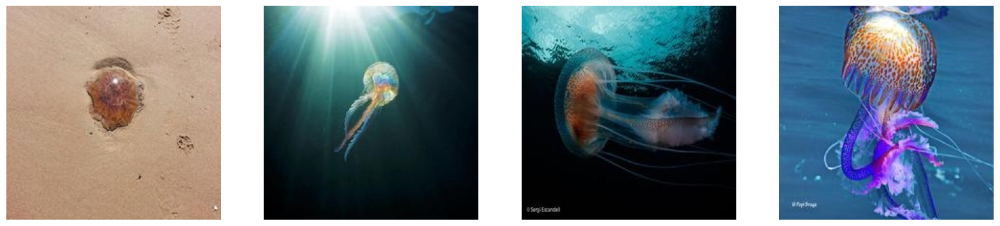

In [ ]:
# Visualization of test_path

plot_images(test_path)

# **3. Feature Engineering**

In [ ]:
# Define hyperparameters

img_height= 224
img_width= 224
batch_size= 32

- sebelum melakukan batch generator untuk train, val, dan test-set, dilakukan pengaturan pixel untuk setiap gambar jellyfish.
- angka 224 dipilih dikarenakan ukuran pixel sebesar ini sudah cukup untuk melihat gambar dengan jelas dan ukuran yang umum digunakan untuk metode konvolusion.
- batch size dipilih 32 karena ukuran yang stabil untuk training.

**Split Data**

In [ ]:
# Create batch generator for train-set, val-set, and test-set

train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

train_set = train_datagen.flow_from_directory(train_path,
                                              target_size=(img_height,img_width),
                                              class_mode='sparse',
                                              subset='training',
                                              batch_size=batch_size,
                                              shuffle=True,
                                              seed=2)

val_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

val_set = val_datagen.flow_from_directory(val_path,
                                            target_size=(img_height,img_width),
                                            class_mode='sparse',
                                            batch_size=batch_size,
                                            shuffle=True,
                                            seed=2)

test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

test_set = test_datagen.flow_from_directory(test_path,
                                            target_size=(img_height,img_width),
                                            class_mode='sparse',
                                            batch_size=batch_size,
                                            shuffle=False,
                                            seed=2)

Found 900 images belonging to 6 classes.
Found 39 images belonging to 6 classes.
Found 40 images belonging to 6 classes.


Dikarenakan pada dataset ini sudah terbagi menjadi 3 path gambar, sehingga split dilakukan sesuai dengan path masing masing. Untuk melakukan training saat ini tidak dilakukan augmentation/improvement apa apa untuk selanjutnya dijadikan bahan pertimbangan model terbaik.

In [ ]:
# Show labels

train_set.class_indices

{'Moon_jellyfish': 0,
 'barrel_jellyfish': 1,
 'blue_jellyfish': 2,
 'compass_jellyfish': 3,
 'lions_mane_jellyfish': 4,
 'mauve_stinger_jellyfish': 5}

klasifikasi kelas pada dataset ini dibagi menjadi 6 kelas atau disebut juga multiclass.

# **4. ANN Training (Sequencial)**

**Model Definition**

In [ ]:
# Clear session

seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

sesi ini dilakukan clear session agar semua layer yang aktif pada sesi ini bersih sebelum dilanjutkan training yang lain.

In [ ]:
# Create Sequential API model

model = Sequential()

#input layer
model.add(Conv2D(32, (3,3), padding='valid', activation='relu', input_shape=(img_height, img_width,3)))
model.add(MaxPooling2D(2, 2))
#hidden layer
model.add(Conv2D(64, (3,3), padding='valid', activation='relu'))
model.add(MaxPooling2D(2, 2))
#hidden layer
model.add(Conv2D(128, (3,3), padding='valid', activation='relu'))
model.add(MaxPooling2D(2, 2))


model.add(Flatten())
model.add(Dropout(0.5))
#layerfullyconnected
model.add(Dense(256, activation='relu'))
model.add(Dense(6, activation='softmax'))


# Compile
model.compile(loss='sparse_categorical_crossentropy', #karena modenya 'sparse' sebelumnya, emg kalo yg lain bakal pake apa?
              optimizer='adam',
              metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 26, 26, 128)       0

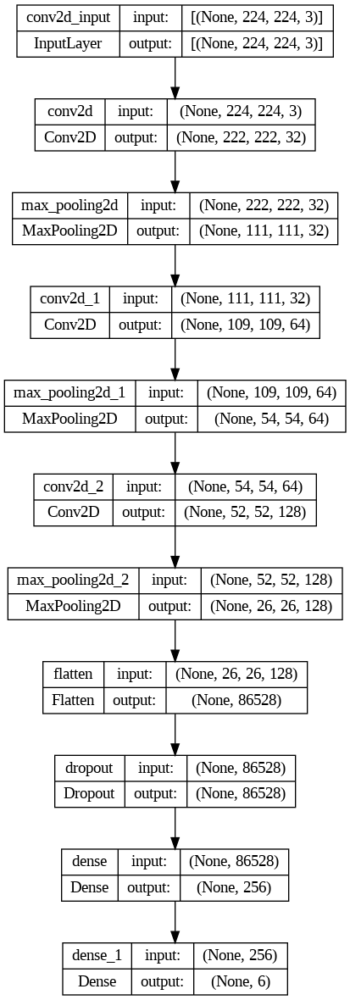

In [ ]:
# Plot layers

tf.keras.utils.plot_model(model, show_shapes=True)

**Model Training**

In [ ]:
# Train the model

%%time
history = model.fit(train_set, epochs=25, validation_data=val_set, batch_size=batch_size)

Epoch 1/25
29/29 [==============================] - 125s 4s/step - loss: 1.9332 - accuracy: 0.2700 - val_loss: 1.4100 - val_accuracy: 0.3846
Epoch 2/25
29/29 [==============================] - 110s 4s/step - loss: 1.3545 - accuracy: 0.4367 - val_loss: 1.3637 - val_accuracy: 0.4103
Epoch 3/25
29/29 [==============================] - 107s 4s/step - loss: 1.0639 - accuracy: 0.6100 - val_loss: 1.4109 - val_accuracy: 0.3846
Epoch 4/25
29/29 [==============================] - 116s 4s/step - loss: 0.8312 - accuracy: 0.6956 - val_loss: 1.7022 - val_accuracy: 0.4872
Epoch 5/25
29/29 [==============================] - 105s 4s/step - loss: 0.5603 - accuracy: 0.8133 - val_loss: 1.4761 - val_accuracy: 0.4872
Epoch 6/25
29/29 [==============================] - 107s 4s/step - loss: 0.3810 - accuracy: 0.8800 - val_loss: 2.2345 - val_accuracy: 0.3333
Epoch 7/25
29/29 [==============================] - 105s 4s/step - loss: 0.3319 - accuracy: 0.8933 - val_loss: 1.8498 - val_accuracy: 0.5385
Epoch 8/25
29

In [ ]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Find the epoch with the highest validation accuracy
best_epoch = val_accuracy.index(max(val_accuracy)) + 1  # Add 1 because epochs are 1-indexed

print(f"Best Accuracy: {accuracy[best_epoch-1]:.4f} at Epoch {best_epoch}")
print(f"Best Validation Accuracy: {val_accuracy[best_epoch-1]:.4f} at Epoch {best_epoch}")

Best Accuracy: 0.8933 at Epoch 7
Best Validation Accuracy: 0.5385 at Epoch 7


Berdasarkan hasil training di atas, didapatkan hasil terbaik pada epoch 7 dengan nilai akurasi 0.8933 dan val akurasi 0.5385. Hasil ini masih termasuk dalam kategori overfitting.

**Model Evaluation**

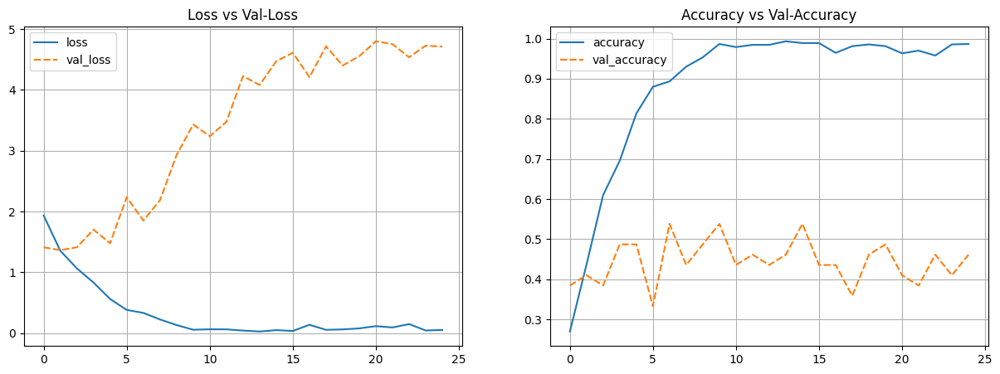

In [ ]:
# Plot training results

history_df = pd.DataFrame(history.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

Mendukung pernyataan sebelumnya, terlihat dari grafik ini bahwa ada gap yang jauh dimana nilai val loss menanjak terus sedangkan nilai loss pada training menurun terus sehingga model ini masih termasuk overfitting.

                         precision    recall  f1-score   support

         Moon_jellyfish       0.43      0.50      0.46         6
       barrel_jellyfish       0.50      0.60      0.55         5
         blue_jellyfish       0.60      0.43      0.50         7
      compass_jellyfish       0.50      0.43      0.46         7
   lions_mane_jellyfish       0.50      0.62      0.56         8
mauve_stinger_jellyfish       0.50      0.43      0.46         7

               accuracy                           0.50        40
              macro avg       0.50      0.50      0.50        40
           weighted avg       0.51      0.50      0.50        40



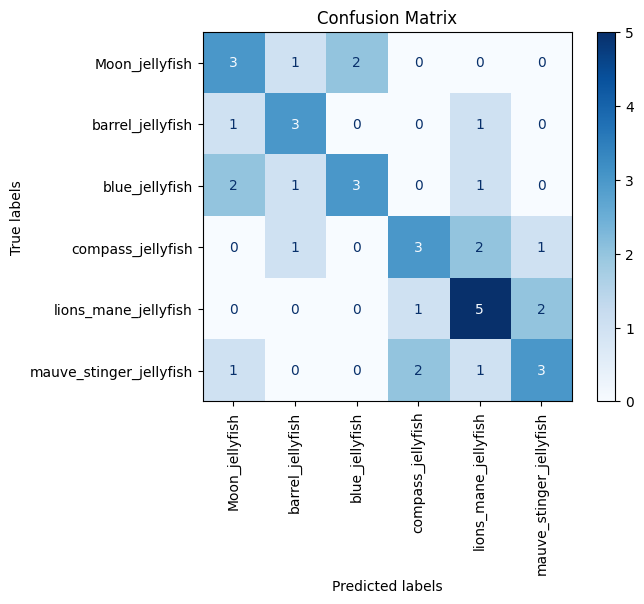

In [64]:
# Check the performance of test-set

## Get the probability
y_pred_prob = model.predict_generator(test_set)

## Get class with maximum probability
y_pred_class = np.argmax(y_pred_prob, axis=-1)

## Display Classification Report
print(classification_report(test_set.classes, y_pred_class, target_names=np.array(list(train_set.class_indices.keys()))))

# Calculate confusion matrix
cm = confusion_matrix(test_set.classes, y_pred_class)

# Display confusion matrix
cm_display = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_set.class_indices.keys())
cm_display.plot(cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.xticks(rotation=90)
plt.show()

Dari hasil evaluasi klasifikasi di atas, beberapa kesimpulan yang dapat dibuat.

- Pada kelas 'Moon Jellyfish', precision sebesar 0.43 menunjukkan bahwa dari semua prediksi yang dilakukan untuk kelas tersebut, hanya 43% yang benar. Recall sebesar 0.50 menunjukkan bahwa model berhasil menemukan 50% dari semua instance yang seharusnya termasuk dalam kelas tersebut.
- akurasi sebesar 0.50 menunjukkan bahwa model ini berhasil memprediksi dengan benar sekitar setengah dari semua dalam data uji.

# **5. ANN Improvement**

##**5.1 Sequencial**

**Preprocessing**


In [ ]:
# Define hyperparameters

img_height= 224
img_width= 224
batch_size= 64

sesi ini dilakukan clear session agar semua layer yang aktif pada sesi ini bersih sebelum dilanjutkan training yang lain.

In [ ]:
# Create batch generator for train-set, val-set, and test-set

train_datagen_aug = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.,\
                                                                rotation_range=20,
                                                                zoom_range=0.05,
                                                                shear_range=0.05,
                                                                horizontal_flip=True)

train_set_aug = train_datagen_aug.flow_from_directory(train_path,
                                              target_size=(img_height,img_width),
                                              class_mode='sparse',
                                              subset='training',
                                              batch_size=batch_size,
                                              shuffle=True,
                                              seed=2)

val_datagen_aug = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

val_set_aug = val_datagen_aug.flow_from_directory(val_path,
                                            target_size=(img_height,img_width),
                                            class_mode='sparse',
                                            batch_size=batch_size,
                                            shuffle=True,
                                            seed=2)

test_datagen_aug = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

test_set_aug = test_datagen_aug.flow_from_directory(test_path,
                                            target_size=(img_height,img_width),
                                            class_mode='sparse',
                                            batch_size=batch_size,
                                            shuffle=False,
                                            seed=2)

Found 900 images belonging to 6 classes.
Found 39 images belonging to 6 classes.
Found 40 images belonging to 6 classes.


Pada model improvement ini, digunakan augmentasi berupa rotasi, zoom, shear, dan horizontal flip. Hal ini dilakukan agar model memiliki bahan training yang lebih banyak sehingga dapat mempengaruhi nilai prediksi.

**Model Definition**

In [ ]:
# Clear session

seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

In [ ]:
# Create Sequential API model


model_aug = Sequential()

model_aug.add(Conv2D(32, (3,3), input_shape=(img_height, img_width, 3)))
model_aug.add(LeakyReLU(alpha=0.3))
model_aug.add(MaxPooling2D(2, 2))
model_aug.add(Conv2D(64, (3,3)))
model_aug.add(LeakyReLU(alpha=0.3))
model_aug.add(MaxPooling2D(2, 2))
model_aug.add(Conv2D(128, (3,3)))
model_aug.add(LeakyReLU(alpha=0.3))
model_aug.add(MaxPooling2D(2, 2))

model_aug.add(Flatten())
model_aug.add(Dropout(0.5))
model_aug.add(Dense(256))
model_aug.add(LeakyReLU(alpha=0.3))
model_aug.add(Dense(6, activation='softmax'))

# Compile
model_aug.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
model_aug.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 222, 222, 32)      0         
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 109, 109, 64)      0         
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                   

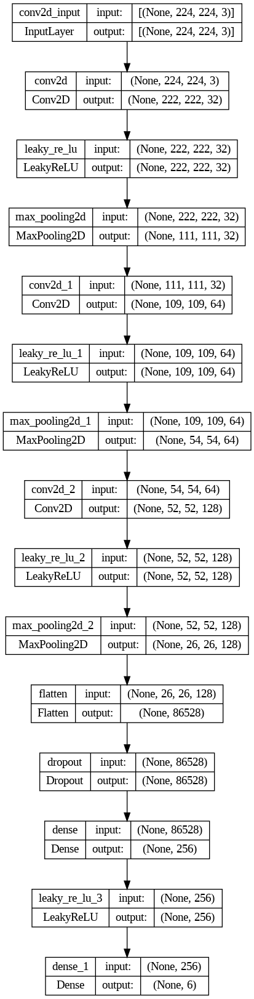

In [ ]:
# Plot layers

tf.keras.utils.plot_model(model_aug, show_shapes=True)

**Model Training**

In [ ]:
# Train the model

%%time
history_aug = model_aug.fit(train_set_aug, epochs=25, validation_data=val_set_aug, batch_size=batch_size, callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True)])

Epoch 1/25
15/15 [==============================] - 120s 8s/step - loss: 2.3132 - accuracy: 0.2644 - val_loss: 1.3687 - val_accuracy: 0.3846
Epoch 2/25
15/15 [==============================] - 116s 8s/step - loss: 1.3936 - accuracy: 0.4200 - val_loss: 1.5033 - val_accuracy: 0.3590
Epoch 3/25
15/15 [==============================] - 117s 8s/step - loss: 1.2569 - accuracy: 0.4967 - val_loss: 1.4067 - val_accuracy: 0.4359
Epoch 4/25
15/15 [==============================] - 118s 8s/step - loss: 1.1329 - accuracy: 0.5678 - val_loss: 1.1756 - val_accuracy: 0.4359
Epoch 5/25
15/15 [==============================] - 119s 8s/step - loss: 1.0270 - accuracy: 0.6100 - val_loss: 1.3427 - val_accuracy: 0.4359
Epoch 6/25
15/15 [==============================] - 118s 8s/step - loss: 0.9752 - accuracy: 0.6144 - val_loss: 1.4741 - val_accuracy: 0.5128
Epoch 7/25
15/15 [==============================] - 117s 8s/step - loss: 0.8496 - accuracy: 0.6822 - val_loss: 1.3870 - val_accuracy: 0.4872
Epoch 8/25
15

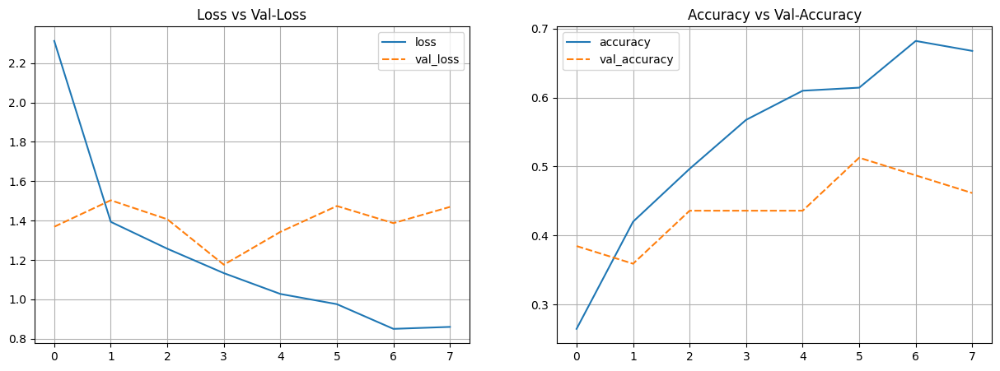

In [ ]:
# Plot training results

history_aug_df = pd.DataFrame(history_aug.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_aug_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_aug_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

**Model Evaluation**

                         precision    recall  f1-score   support

         Moon_jellyfish       0.67      0.67      0.67         6
       barrel_jellyfish       0.75      0.60      0.67         5
         blue_jellyfish       0.67      0.57      0.62         7
      compass_jellyfish       0.44      0.57      0.50         7
   lions_mane_jellyfish       0.75      0.75      0.75         8
mauve_stinger_jellyfish       0.71      0.71      0.71         7

               accuracy                           0.65        40
              macro avg       0.67      0.65      0.65        40
           weighted avg       0.66      0.65      0.65        40



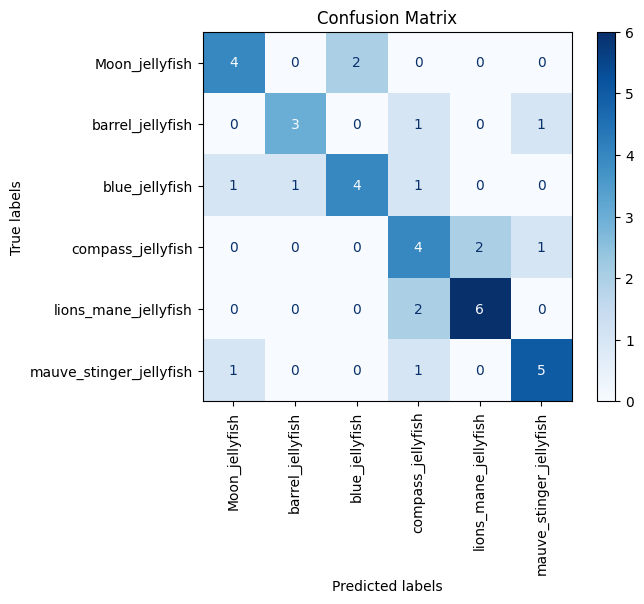

In [65]:
# Check the performance of test-set

## Get the probability
y_pred_prob_aug = model_aug.predict_generator(test_set)

## Get class with maximum probability
y_pred_class_aug = np.argmax(y_pred_prob_aug, axis=-1)

## Display Classification Report
print(classification_report(test_set_aug.classes, y_pred_class_aug, target_names=np.array(list(train_set_aug.class_indices.keys()))))

# Calculate confusion matrix
cm = confusion_matrix(test_set_aug.classes, y_pred_class_aug)

# Display confusion matrix
cm_display = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_set_aug.class_indices.keys())
cm_display.plot(cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.xticks(rotation=90)
plt.show()

Dari hasil evaluasi klasifikasi model yang dilaukan augmentasi, kita dapat melihat beberapa perubahan dalam performa model dibandingkan dengan hasil sebelumnya:

- Secara keseluruhan, nilai precision, recall, dan f1-score untuk setiap kelas telah meningkat. Ini menunjukkan bahwa model lebih baik dalam memprediksi kelas-kelas yang berbeda.
- Untuk sebagian besar kelas, terdapat peningkatan baik dalam precision maupun recall, yang mengarah pada peningkatan nilai f1-score. Namun, kelas 'compass_jellyfish' mengalami penurunan dalam recall meskipun terjadi peningkatan dalam precision.
- Akurasi secara keseluruhan telah meningkat menjadi 0.65, menunjukkan bahwa model lebih baik dalam memprediksi dengan benar sekitar 65% dari semua instance dalam data uji.


## **5.2 Transfer Learning**

Model improvement kedua yang dilakukan adalah dengan menggunakan transfer learning.

In [ ]:
# Define hyperparameters

img_height= 224
img_width= 224
batch_size= 64

In [ ]:
# menggunakan InceptionResNetV2 sebagai model improvement
model_tl = tf.keras.applications.InceptionResNetV2(
    include_top=False,
    weights='imagenet',
    input_shape=(img_height,img_width,3),
    pooling='avg',
)
model_tl.trainable = False

219055592/219055592 [==============================] - 1s 0us/step


Model improvement yang dipilih adalah InceptionResNetV2, karena InceptionResNetV2 adalah pengembangan dari dua arsitektur, yaitu Inception dan ResNet. Ini menggabungkan keunggulan kedua arsitektur tersebut, yaitu kemampuan dalam menangani informasi spasial dengan baik (Inception) dan kemampuan dalam mengatasi masalah gradien yang menghilang (ResNet). Dengan demikian, InceptionResNetV2 memiliki kemampuan untuk mempelajari representasi gambar yang sangat kompleks dan mendalam.

In [ ]:
# Create batch generator for train-set, val-set, and test-set

train_datagen_tl = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.,
                                                                rotation_range=20,
                                                                zoom_range=0.05,
                                                                shear_range=0.05,
                                                                horizontal_flip=True)

train_set_tl = train_datagen_tl.flow_from_directory(train_path,
                                              target_size=(img_height,img_width),
                                              class_mode='sparse',
                                              subset='training',
                                              batch_size=batch_size,
                                              shuffle=True,
                                              seed=2)

val_datagen_tl = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

val_set_tl = val_datagen_tl.flow_from_directory(val_path,
                                            target_size=(img_height,img_width),
                                            class_mode='sparse',
                                            batch_size=batch_size,
                                            shuffle=True,
                                            seed=2)

test_datagen_tl = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

test_set_tl = test_datagen_tl.flow_from_directory(test_path,
                                            target_size=(img_height,img_width),
                                            class_mode='sparse',
                                            batch_size=batch_size,
                                            shuffle=False,
                                            seed=2)

Found 900 images belonging to 6 classes.
Found 39 images belonging to 6 classes.
Found 40 images belonging to 6 classes.


**Model Definition**

In [ ]:
# Clear session

seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

In [ ]:
# Create Sequential API model

model_tlr = Sequential()
model_tlr.add(model_tl)
model_tlr.add(Flatten())
model_tlr.add(Dense(512, activation='relu'))
model_tlr.add(Dense(256, activation='relu'))
model_tlr.add(Dense(6, activation='softmax'))

# Compile
model_tlr.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
model_tlr.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_resnet_v2 (Funct  (None, 1536)              54336736  
 ional)                                                          
                                                                 
 flatten (Flatten)           (None, 1536)              0         
                                                                 
 dense (Dense)               (None, 512)               786944    
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dense_2 (Dense)             (None, 6)                 1542      
                                                                 
Total params: 55256550 (210.79 MB)
Trainable params: 919814 (3.51 MB)
Non-trainable params: 54336736 (207.28 MB)
_________

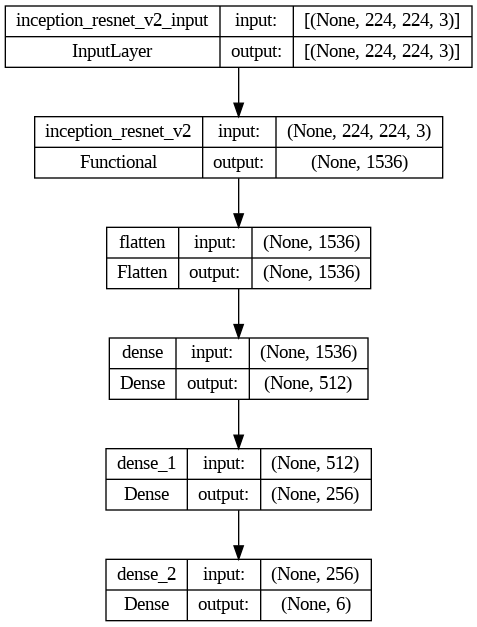

In [ ]:
# Plot layers

tf.keras.utils.plot_model(model_tlr, show_shapes=True)

**Model Training**

In [ ]:
# Train the model

%%time
history_tl = model_tlr.fit(train_set_tl, epochs=25, validation_data=val_set_tl, batch_size=batch_size,
                          callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True)])

Epoch 1/25
15/15 [==============================] - 276s 17s/step - loss: 1.8582 - accuracy: 0.3067 - val_loss: 1.6129 - val_accuracy: 0.2821
Epoch 2/25
15/15 [==============================] - 259s 17s/step - loss: 1.2430 - accuracy: 0.5233 - val_loss: 1.2800 - val_accuracy: 0.4615
Epoch 3/25
15/15 [==============================] - 259s 17s/step - loss: 0.9514 - accuracy: 0.6478 - val_loss: 1.2005 - val_accuracy: 0.5641
Epoch 4/25
15/15 [==============================] - 269s 18s/step - loss: 0.7570 - accuracy: 0.7033 - val_loss: 1.0781 - val_accuracy: 0.6667
Epoch 5/25
15/15 [==============================] - 262s 17s/step - loss: 0.6912 - accuracy: 0.7322 - val_loss: 1.0006 - val_accuracy: 0.7436
Epoch 6/25
15/15 [==============================] - 258s 17s/step - loss: 0.5664 - accuracy: 0.7778 - val_loss: 1.0774 - val_accuracy: 0.6667
Epoch 7/25
15/15 [==============================] - 260s 17s/step - loss: 0.4957 - accuracy: 0.8311 - val_loss: 1.0137 - val_accuracy: 0.6923
Epoch 

Berdasarkan history training model, menggunakan early stopping dengan patience 4 didapatkan val_loss terbaik pada epoch 5 yaitu nilai akurasi training sebesar 0.7322, val_accuracy sebesar 0.7436 yang menandakan model ini sudah termasuk goodfit.

**Model Evaluation**

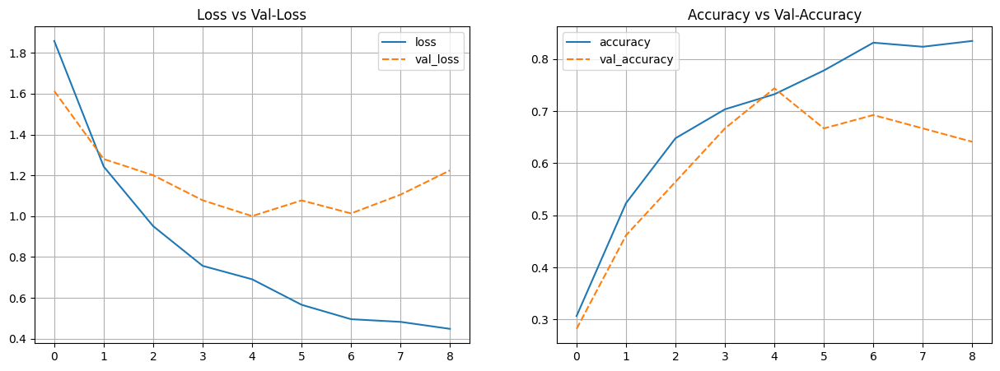

In [ ]:
# Plot training results

history_tl_df = pd.DataFrame(history_tl.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_tl_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_tl_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

                         precision    recall  f1-score   support

         Moon_jellyfish       0.60      1.00      0.75         6
       barrel_jellyfish       1.00      0.80      0.89         5
         blue_jellyfish       1.00      0.43      0.60         7
      compass_jellyfish       0.83      0.71      0.77         7
   lions_mane_jellyfish       0.57      1.00      0.73         8
mauve_stinger_jellyfish       1.00      0.43      0.60         7

               accuracy                           0.73        40
              macro avg       0.83      0.73      0.72        40
           weighted avg       0.83      0.72      0.71        40



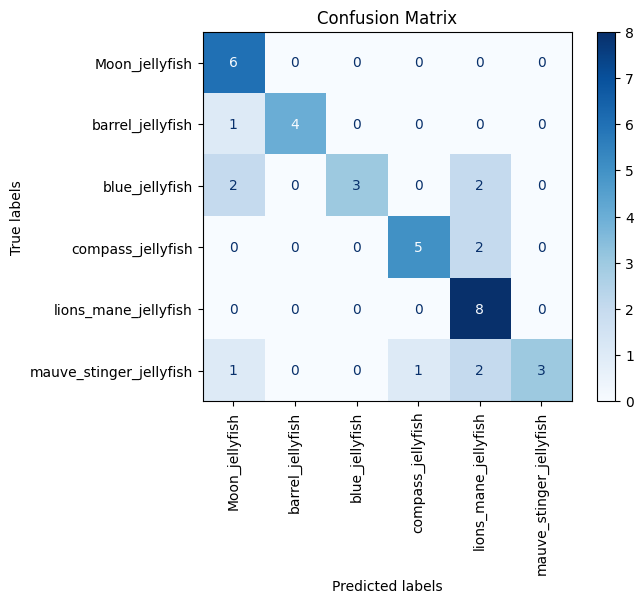

In [ ]:
# Check the performance of test-set

## Get the probability
y_pred_prob_tl = model_tlr.predict_generator(test_set_tl)

## Get class with maximum probability
y_pred_class_tl = np.argmax(y_pred_prob_tl, axis=-1)

## Display Classification Report
print(classification_report(test_set_tl.classes, y_pred_class_tl, target_names=np.array(list(train_set_tl.class_indices.keys()))))

# Calculate confusion matrix
cm = confusion_matrix(test_set_tl.classes, y_pred_class_tl)

# Display confusion matrix
cm_display = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_set_tl.class_indices.keys())
cm_display.plot(cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.xticks(rotation=90)
plt.show()

Kesimpulan yang dibuat berdarkan evaluasi model transfer learning yang kedua adalah.

- Hampir semua kelas memiliki nilai precision dan recall yang lebih baik, menghasilkan peningkatan nilai f1-score yang signifikan. Peningkatan paling mencolok terjadi pada kelas 'barrel_jellyfish' dan 'mauve_stinger_jellyfish'.
- Akurasi secara keseluruhan telah meningkat menjadi 0.73, menunjukkan bahwa model lebih baik dalam memprediksi dengan benar sekitar 73% dari semua instance dalam data uji.

# **6. Model Saving**

Setelah dilakukan beberapa model training ANN dan Improvement, kemudian dipilih model yang dapat memprediksi dataset dengan baik yaitu InceptionResNetV2.

In [63]:
#Save model

#freeze model
model_tlr.trainable = False

model_tlr.save('best_model.keras')

# **7. Model Inference**

Model Inference dilakukan pada notebook yang berbeda.

# **8. Analysis**

Secara keseluruhan, program dijalankan dengan langkah-langkah berikut.

- Mengimport library yang dibutuhkan
- Mendownload dataset dari kaggle dengan membuat API sehingga bisa dijalankan langsung dari colab.
- eksplorasi data dengan visualisasi
- Feature Engineering untuk melakukan split data train test dan val.
- modelling dengan ANN dan Improvement.

Program berjalan dengan baik meskipun masih terdapat error pada bagian eksplorasi data dengan visualisasi.

Setelah melakukan beberapa modelling dan membandingkannya:
- model pertama yang dilakukan tanpa improvement menunjukkann hasil evaluasi yang sangat overfit, dengan nilai akurasi 0.50 artinya model hanya bisa memprediksi setengah dari data uji.
- model kedua dengan dilakukan augmentasi menunjukkan hasil evaluasi yang lebih baik dibandingkan model sebelumnya, namun hasil akurasi yang meningkat menjadi 0.65 belum menunjukkan prediksi yang bagus.
- Model ketiga yang dilakukan dengan menggunakan transfer learning InceptionResNetV2 menunjukkan hasil akurasi 0.73, angka ini meningkat sangat signifikan daripada model yang pertama dan grafiknya pun lebih mendekati kategori goodfit meskipun masih kurang baik. Dari hasil confusion matrix, terlihat bahwa model dapat memprediksi true positif lebih baik.

 Program ini dapat digunakan dalam berbagai aplikasi, termasuk penelitian kelautan, konservasi lingkungan, dan pencegahan insiden terkait ubur-ubur di perairan. Dalam ranah dunia bisnis, model ini dapat digunakan untuk memprediksi ubur - ubur yang akhir akhir ini diketahui dapat dimanfaatkan sebagai [collagen](https://www.sciencedirect.com/science/article/abs/pii/S0924224423003217) dalam produk kecantikan.

 Future improvement dari program ini adalah terkait pembagian data uji, test, dan validasi yang bisa dilakukan dengan menambahkan jumlah proporsinya sehingga bisa lebih representatif, mencoba menggunakan beberapa model lain dengan parameter yang disesuaikan sehingga bisa menemukan hasil akurasi yang lebih baik.
